## **About the data**

**TRAINING**

**`train_customers.csv`**
 - `ID`: ID of each client
 - `LIMIT_BAL`: Amount of given credit in NT dollars (includes individual and family/supplementary credit)
 - `SEX`: Gender (1=male, 2=female)
 - `EDUCATION`: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
 - `MARRIAGE`: Marital status (1=married, 2=single, 3=others)
 - `AGE`: Age in years
 
**`train_series.csv`**
 - `ID`: ID of each client
 - `MONTH`: The month to which the data is referring to
 - `PAY`: Repayment status in the corresponding month (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, … 8=payment delay for eight months, 9=payment delay for nine months and above)
   
   **Updated definition of repayment status**
    - -2: No need to pay, zero balance
    - -1: Paid in full
    - 0: The use of revolving credit i.e the client paid more than the minimum amount due but less than the full amount due
    - 8: Delay of 8 months or more
 - `BILL_AMT`: Amount of bill statement in the corresponding month (NT dollar)
 - `PAY_AMT`: Amount of previous payment in the corresponding month (NT dollar)
 
**`train_target.csv`**
 - `DEFAULT_JULY`: Default payment in July (1=yes, 0=no)
 
 
**TEST**
 - **`test_data.csv`**
 
**SUBMISSION**
 - **`submission_features.csv`**

## **A. DATA ENGINEERING**

In [ ]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, roc_curve, auc
import seaborn as sns
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
#Hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
#Bagging
from sklearn.ensemble import RandomForestClassifier
#XGBoost
from xgboost import XGBClassifier
#!pip install hyperopt
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn import model_selection
from sklearn.metrics import classification_report
import pickle

import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Load data
train_customers = pd.read_csv('train_customers.csv')
train_series = pd.read_csv('train_series.csv')
train_target = pd.read_csv('train_target.csv')

In [ ]:
train_customers.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE
0,9910,130000.0,2,2,1,27
1,15561,60000.0,2,3,1,48
2,23607,330000.0,2,1,2,44
3,6314,60000.0,2,2,2,24
4,27534,180000.0,2,1,2,33


In [ ]:
train_series.head()

,ID,MONTH,PAY,BILL_AMT,PAY_AMT
0,9910,JUNE,0.0,76885.0,3500.0
1,9910,MAY,0.0,79106.0,4000.0
2,9910,APRIL,0.0,81231.0,3000.0
3,9910,MARCH,0.0,81983.0,3146.0
4,9910,FEBRUARY,0.0,83773.0,3260.0


In [ ]:
train_target.head()

,ID,DEFAULT_JULY
0,9910,0
1,15561,1
2,23607,1
3,6314,0
4,27534,0


### **Pivot time-dependent columns**

Pivot the time-dependent columns (PAY, BILL_AMT, and PAY_AMT) to build one column of these per month. (Ex. PAY_JUNE, PAY_MAY, ..., BILL_AMT_JUNE, ...)

In [ ]:
train_series = train_series.pivot_table(index='ID', columns='MONTH', values=['PAY', 'BILL_AMT', 'PAY_AMT'])
train_series.columns = ['_'.join(col).upper() for col in train_series.columns]
train_series.reset_index(inplace=True)

train_series[train_series['ID'] == 9910]

,ID,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,BILL_AMT_MARCH,BILL_AMT_MAY,PAY_APRIL,PAY_FEBRUARY,PAY_JANUARY,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY
6655,9910,81231.0,83773.0,85532.0,76885.0,81983.0,79106.0,0.0,0.0,0.0,0.0,0.0,0.0,3000.0,3260.0,3200.0,3500.0,3146.0,4000.0


### **Appending to training data**

In [ ]:
train_data = pd.merge(train_customers, train_series, on='ID', how='left')

#Check whether size of train_data is equal to size of train_customers
print('Size of train_customers: ', train_customers.shape[0])
print('Size of train_data: ', train_data.shape[0])

#Check whether there are duplicated ID in train_data
print('Number of duplicated ID: ', train_data['ID'].duplicated().sum())

train_data.head()

Size of train_customers:  20000
Size of train_data:  20000
Number of duplicated ID:  0


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,...,PAY_JANUARY,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY
0,9910,130000.0,2,2,1,27,81231.0,83773.0,85532.0,76885.0,...,0.0,0.0,0.0,0.0,3000.0,3260.0,3200.0,3500.0,3146.0,4000.0
1,15561,60000.0,2,3,1,48,8422.0,3910.0,2431.0,4823.0,...,-1.0,-1.0,-1.0,-1.0,4377.0,2431.0,2120.0,5491.0,3918.0,9683.0
2,23607,330000.0,2,1,2,44,253863.0,262753.0,268145.0,243621.0,...,0.0,0.0,0.0,0.0,9400.0,9766.0,9786.0,21400.0,9542.0,0.0
3,6314,60000.0,2,2,2,24,15069.0,5879.0,-2879.0,29832.0,...,0.0,0.0,0.0,0.0,1000.0,1329.0,41378.0,1538.0,118.0,1308.0
4,27534,180000.0,2,1,2,33,178.0,0.0,1118.0,4500.0,...,-1.0,-2.0,-1.0,-2.0,1500.0,1118.0,1331.0,2580.0,0.0,178.0


### **Including target information**

In [ ]:
train_data_fin = pd.merge(train_data, train_target, on='ID', how='left')

#Check whether size of train_data_fin is equal to size of train_data
print('Size of train_data: ', train_data.shape[0])
print('Size of train_data_fin: ', train_data_fin.shape[0])

#Check whether there are duplicated ID in train_data_fin
print('Number of duplicated ID: ', train_data_fin['ID'].duplicated().sum())

train_data_fin.head()

Size of train_data:  20000
Size of train_data_fin:  20000
Number of duplicated ID:  0


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,...,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY,DEFAULT_JULY
0,9910,130000.0,2,2,1,27,81231.0,83773.0,85532.0,76885.0,...,0.0,0.0,0.0,3000.0,3260.0,3200.0,3500.0,3146.0,4000.0,0
1,15561,60000.0,2,3,1,48,8422.0,3910.0,2431.0,4823.0,...,-1.0,-1.0,-1.0,4377.0,2431.0,2120.0,5491.0,3918.0,9683.0,1
2,23607,330000.0,2,1,2,44,253863.0,262753.0,268145.0,243621.0,...,0.0,0.0,0.0,9400.0,9766.0,9786.0,21400.0,9542.0,0.0,1
3,6314,60000.0,2,2,2,24,15069.0,5879.0,-2879.0,29832.0,...,0.0,0.0,0.0,1000.0,1329.0,41378.0,1538.0,118.0,1308.0,0
4,27534,180000.0,2,1,2,33,178.0,0.0,1118.0,4500.0,...,-2.0,-1.0,-2.0,1500.0,1118.0,1331.0,2580.0,0.0,178.0,0


In [ ]:
train_data = train_data_fin.copy()

In [ ]:
#Export to csv
train_data.to_csv('ROYSAHANA_A_train.csv', index=False)

## **B. EXPLORATORY DATA ANALYSIS**

Plotting the distribution of defaulters given the Education

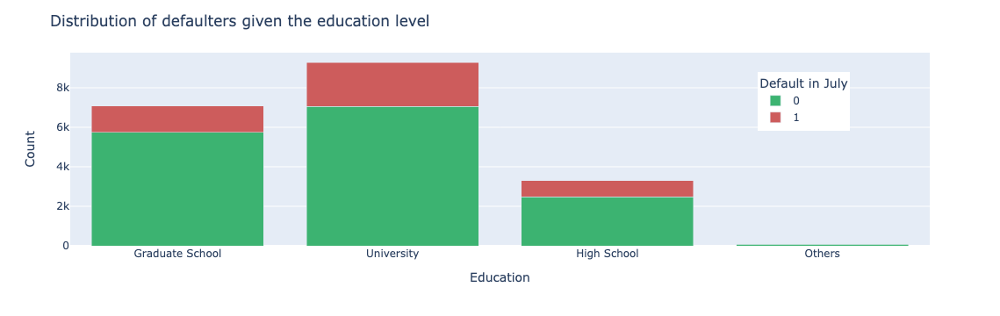

In [ ]:
#Discretise DEFAULT_JULY into 0 (non-defaulters) and 1 (defaulters): Convert DEFAULT_JULY to categorical
train_data['DEFAULT_JULY2'] = train_data['DEFAULT_JULY'].astype('category')

fig = px.bar(train_data[train_data['EDUCATION'].isin([1,2,3,4])].groupby(['EDUCATION', 'DEFAULT_JULY2']).size().reset_index(name='count'),
             x='EDUCATION',
             y='count',
             color='DEFAULT_JULY2',
             barmode='stack',
             color_discrete_map={'0': 'mediumseagreen', '1': 'indianred'},
             color_discrete_sequence=['mediumseagreen', 'indianred'])
fig.update_layout(title='Distribution of defaulters given the education level',
                  xaxis_title='Education',
                  yaxis_title='Count',
                  xaxis={'categoryorder':'array', 'categoryarray':[1,2,3,4]},
                  xaxis_tickvals=[1,2,3,4],
                  xaxis_ticktext=['Graduate School', 'University', 'High School', 'Others'],
                  legend_title='Default in July',
                  legend={'x':0.8, 'y':0.9},
                  showlegend=True)

fig.show()

train_data = train_data.drop('DEFAULT_JULY2', axis=1)

From the bar plot above, we can see that the number of defaulters is higher for those who have education level 1 (graduate school) and 2 (university) than those who have education level 3 (high school) and 4 (others). This is because, credit has been extended to those who have higher education level, and thus proportionally more defaulters are expected.

However, when considering those who paid their dues on time, the number of defaulters is higher for those who have education level 3 (high school) and 4 (others) than those who are graduate school or university educated. This may be because, those who have higher education level are more likely to have a higher income and thus more likely to pay their dues on time.

Plotting the distribution of `LIMIT_BAL` per defaulters and non-defaulters

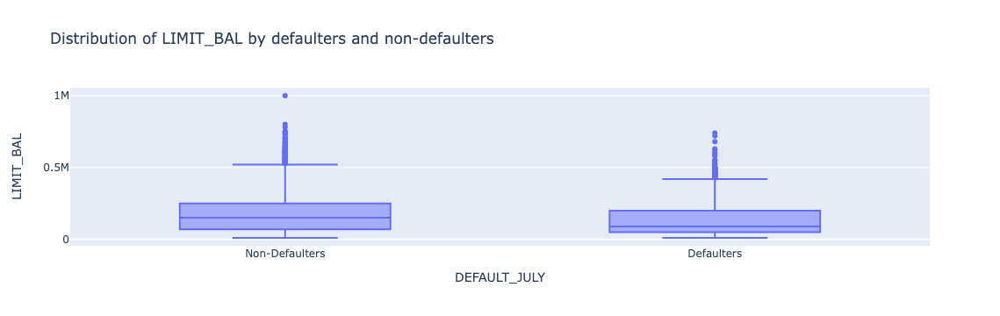

In [ ]:
fig = px.box(train_data, x='DEFAULT_JULY', y='LIMIT_BAL', title='Distribution of LIMIT_BAL by defaulters and non-defaulters')
fig.update_xaxes(ticktext=['Non-Defaulters', 'Defaulters'], tickvals=[0, 1])
fig.show()

Note: LIMIT_BAL is the credit limit of the customer which includes individual and family/supplementary credit.
From the box plot above, we can see that the median of LIMIT_BAL for defaulters is lower than that of non-defaulters.
Also, non-defaulters have a wider range of LIMIT_BAL than defaulters with more outliers (on an average, higher credit limit) when compared to defaulters.

### Additional insights

#### Insight 1

In [ ]:
def plot_univariate_hist(feature_name):
    return px.histogram(train_data, x=feature_name, color="DEFAULT_JULY", marginal="box", template="none", title=f"Histogram: {feature_name}", histnorm="probability density")

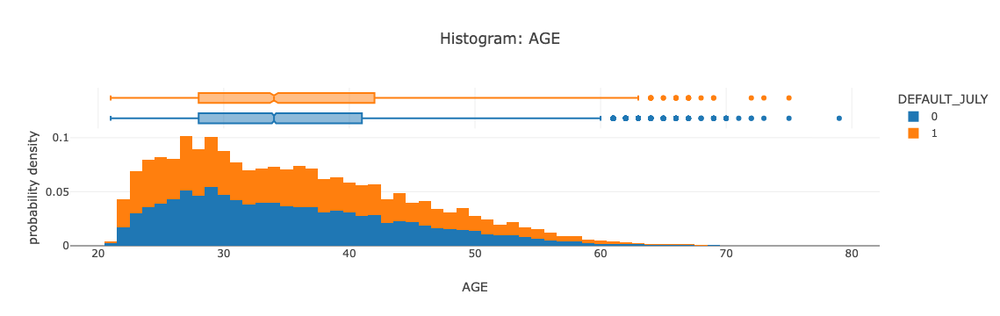

In [ ]:
fig = plot_univariate_hist('AGE')
fig.show()

In [ ]:
#Check correlation between AGE and DEFAULT_JULY
train_data[['AGE', 'DEFAULT_JULY']].corr()
print("Pearson's correlation coefficient: ", train_data[['AGE', 'DEFAULT_JULY']].corr().iloc[0,1])

Pearson's correlation coefficient:  0.014780892761136819


**<em>Insight 1:</em>** The distribution of AGE per defaulters and non-defaulters is similar. This is because, the age of the customer does not seem to have a significant impact on whether the customer will default or not.
This is confirmed by the correlation between AGE and DEFAULT_JULY which is 0.01478

#### Insight 2

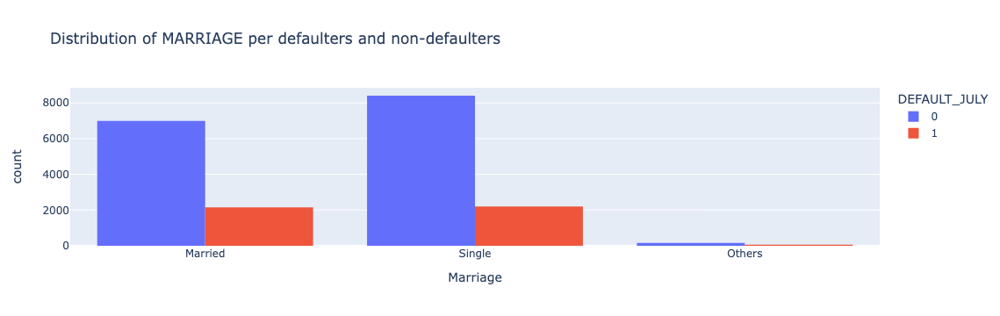

In [ ]:
fig = px.histogram(train_data[train_data['MARRIAGE'] != 0], x='MARRIAGE', color='DEFAULT_JULY', barmode='group', title='Distribution of MARRIAGE per defaulters and non-defaulters')
#Rename axes tick labels
fig.update_xaxes(title_text='Marriage', ticktext=['Married', 'Single', 'Others'], tickvals=[1, 2, 3])

fig.show()

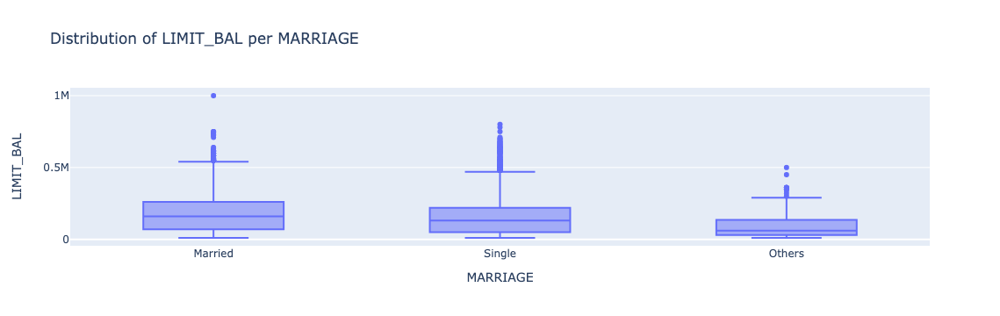

In [ ]:
fig = px.box(train_data[train_data['MARRIAGE'] != 0], x='MARRIAGE', y='LIMIT_BAL', title='Distribution of LIMIT_BAL per MARRIAGE')
#Rename x-axis labels
fig.update_xaxes(ticktext=['Married', 'Single', 'Others'], tickvals=[1, 2, 3])
fig.show()

**<em>Insight 2:</em>** From the first plot, we can see that the number of defaulters is higher for those who are single than those who are married. This is because, a greater number of credit loans have been extended to those who are single, and thus proportionally more defaulters are expected.
However, from the second plot, we can see that the median of LIMIT_BAL for those who are single is lower than that of those who are married. Those who are married take a larger credit loan on an average than those who are single as seen by the range of LIMIT_BAL.
It is possible that married people default less despite the larger credit loan because they may have a higher (combined)income and are thus more likely to pay their dues on time. Also, since LIMIT_BAL includes family/supplementary credit, married people may have taken a larger credit loan for their family members.

#### Insight 3

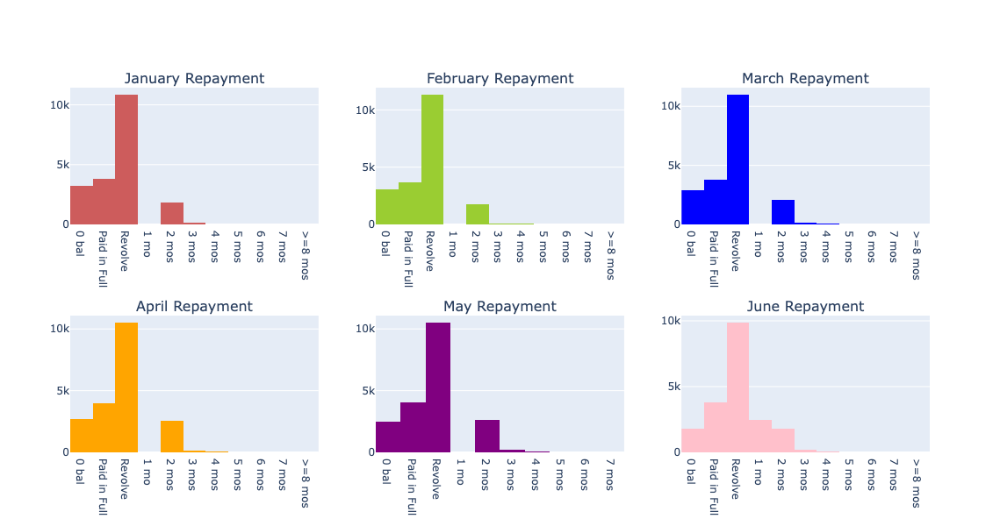

In [ ]:
fig = make_subplots(rows=2, cols=3, subplot_titles=('January Repayment', 'February Repayment', 'March Repayment', 'April Repayment', 'May Repayment', 'June Repayment'))

#Add traces
fig.add_trace(go.Histogram(x=train_data['PAY_JANUARY'], marker_color='indianred'), row=1, col=1)
fig.add_trace(go.Histogram(x=train_data['PAY_FEBRUARY'], marker_color='yellowgreen'), row=1, col=2)
fig.add_trace(go.Histogram(x=train_data['PAY_MARCH'], marker_color='blue'), row=1, col=3)
fig.add_trace(go.Histogram(x=train_data['PAY_APRIL'], marker_color='orange'), row=2, col=1)
fig.add_trace(go.Histogram(x=train_data['PAY_MAY'], marker_color='purple'), row=2, col=2)
fig.add_trace(go.Histogram(x=train_data['PAY_JUNE'], marker_color='pink'), row=2, col=3)

#Update xaxis ticks
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=1, col=1)
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=1, col=2)
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=1, col=3)
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=2, col=1)
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=2, col=2)
fig.update_xaxes(ticktext=['0 bal', 'Paid in Full', 'Revolve', '1 mo', '2 mos', '3 mos', '4 mos', '5 mos', '6 mos', '7 mos', '>=8 mos'], tickvals=[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8], row=2, col=3)

#Disable legend
fig.update_layout(showlegend=False)

#Update layout
fig.update_layout(height=600, width=800)
fig.show()

In [ ]:
#Check the correlation of each month's repayment status with DEFAULT_JULY
print('Correlation of January Repayment with DEFAULT_JULY: ', train_data['PAY_JANUARY'].corr(train_data['DEFAULT_JULY']))
print('Correlation of February Repayment with DEFAULT_JULY: ', train_data['PAY_FEBRUARY'].corr(train_data['DEFAULT_JULY']))
print('Correlation of March Repayment with DEFAULT_JULY: ', train_data['PAY_MARCH'].corr(train_data['DEFAULT_JULY']))
print('Correlation of April Repayment with DEFAULT_JULY: ', train_data['PAY_APRIL'].corr(train_data['DEFAULT_JULY']))
print('Correlation of May Repayment with DEFAULT_JULY: ', train_data['PAY_MAY'].corr(train_data['DEFAULT_JULY']))
print('Correlation of June Repayment with DEFAULT_JULY: ', train_data['PAY_JUNE'].corr(train_data['DEFAULT_JULY']))

Correlation of January Repayment with DEFAULT_JULY:  0.18580700952582882
Correlation of February Repayment with DEFAULT_JULY:  0.19699108331831347
Correlation of March Repayment with DEFAULT_JULY:  0.20999847577033404
Correlation of April Repayment with DEFAULT_JULY:  0.22832413282356656
Correlation of May Repayment with DEFAULT_JULY:  0.26368662570028945
Correlation of June Repayment with DEFAULT_JULY:  0.32359081709984583


**<em>Insight 3:</em>** From the plots, we can see that the repayment distribution is similar for all months.
However, in June, there is an increase in the number of customers who have a 1 month delay in repayment. This could be because the customers who have revolved their credit in May have a 1 month delay in repayment in June as the amount due is not paid in full.
This means that PAY_JUNE is a significant feature in predicting DEFAULT_JULY. This is confirmed by the correlation values.

## **C. MACHINE LEARNING**

In this part, we're going to build a machine learning model to estimate the probability of default of the customers. For this part, we need two additional dataset:
- **test_data.csv** - Contains new data from 9000 customers with the same structure as the training data from Part 1. It contains all the features and the target already joined. You can use this data set for testing purposes (or you can build your own test set from the training set). Anyway, keep it because you will need it for question C.2
- **submission_features.csv** - This contains data associated with unseen customers, but without the target.

**SOME CONSIDERATIONS**
- I try several models to select the best suited for this problem
- Hyperparameter tuning to select the best configuration for the model

In [ ]:
#Load data
train_data = pd.read_csv("ROYSAHANA_A_train.csv")

In [ ]:
#Drop ID
train_data.drop('ID', axis=1, inplace=True)

In [ ]:
#Split data into X and y
X = train_data.drop('DEFAULT_JULY', axis=1)
y = train_data['DEFAULT_JULY']

In [ ]:
#Scale data
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=train_data.drop('DEFAULT_JULY', axis=1).columns)
X.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,...,PAY_JANUARY,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY
count,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,...,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04
mean,-5.826450e-17,-5.044853e-17,1.925571e-16,4.929390e-17,1.588063e-16,-2.870593e-16,-5.258016e-17,-7.105427e-19,-1.705303e-17,-3.410605e-17,...,2.167155e-17,2.096101e-17,3.410605e-17,-1.634248e-17,8.526513e-18,-3.730349e-18,2.415845e-17,-1.909584e-17,1.953993e-17,1.421085e-17
std,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,...,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00
min,-1.726724e+00,-1.217036e+00,-1.239671e+00,-2.341231e+00,-2.968295e+00,-1.570261e+00,-2.926187e+00,-1.996316e+00,-1.885595e+00,-2.927265e+00,...,-1.492180e+00,-1.767840e+00,-1.523328e+00,-1.561144e+00,-2.855653e-01,-3.094928e-01,-3.097193e-01,-3.384353e-01,-3.028724e-01,-2.522697e-01
25%,-8.644692e-01,-9.088370e-01,-1.239671e+00,-1.078329e+00,-1.053328e+00,-8.119060e-01,-6.367135e-01,-6.331002e-01,-6.299371e-01,-6.457073e-01,...,-6.190751e-01,-8.761175e-01,-6.648491e-01,-7.242713e-01,-2.643734e-01,-2.908498e-01,-3.000550e-01,-2.794114e-01,-2.839088e-01,-2.164058e-01
50%,1.368519e-03,-2.153894e-01,8.066659e-01,1.845731e-01,8.616396e-01,-1.618872e-01,-3.841512e-01,-3.622704e-01,-3.644908e-01,-3.907668e-01,...,2.540299e-01,1.560515e-02,1.936300e-01,1.126012e-01,-1.881682e-01,-2.133121e-01,-2.179692e-01,-2.143361e-01,-2.102163e-01,-1.658438e-01
75%,8.666572e-01,5.551078e-01,8.066659e-01,1.845731e-01,8.616396e-01,6.235522e-01,1.818522e-01,1.606134e-01,1.683977e-01,2.152498e-01,...,2.540299e-01,1.560515e-02,1.936300e-01,1.126012e-01,-3.950388e-02,-5.068661e-02,-6.505245e-02,-4.176619e-02,-5.243858e-02,-3.738674e-02
max,1.740325e+00,6.410887e+00,8.066659e-01,5.236181e+00,2.776607e+00,4.713254e+00,2.314677e+01,1.453767e+01,1.541149e+01,1.231483e+01,...,7.238870e+00,7.149387e+00,7.061463e+00,5.970708e+00,4.766590e+01,2.703974e+01,2.678719e+01,5.123488e+01,3.805672e+01,7.213146e+01


In [ ]:
#Recursive Feature Selection 

NUM_FEATURES = 5
model = LogisticRegression()

rfe_stand = RFE(model, step=NUM_FEATURES)

In [ ]:
fit_stand = rfe_stand.fit(X, y)

print("Std Model Feature Ranking:", fit_stand.ranking_)

# calculate the score for the selected features
score_stand = rfe_stand.score(X,y)
print("Standardized Model Score with selected features is: %f (%f)" % (score_stand.mean(), score_stand.std()))

Std Model Feature Ranking: [1 3 3 1 3 1 1 4 1 1 2 2 4 4 1 4 1 4 3 3 1 1 1]
Standardized Model Score with selected features is: 0.809650 (0.000000)


In [ ]:
train_names = np.array(X.columns)
print('Most important features (RFE): %s'% train_names[rfe_stand.support_])

Most important features (RFE): ['LIMIT_BAL' 'MARRIAGE' 'BILL_AMT_APRIL' 'BILL_AMT_FEBRUARY'
 'BILL_AMT_JUNE' 'BILL_AMT_MARCH' 'PAY_JUNE' 'PAY_MAY' 'PAY_AMT_JUNE'
 'PAY_AMT_MARCH' 'PAY_AMT_MAY']


In [ ]:
imp_feat = ['LIMIT_BAL' 'MARRIAGE' 'BILL_AMT_APRIL' 'BILL_AMT_FEBRUARY'
 'BILL_AMT_JUNE' 'BILL_AMT_MARCH' 'PAY_JUNE' 'PAY_MAY' 'PAY_AMT_JUNE'
 'PAY_AMT_MARCH' 'PAY_AMT_MAY']

X_imp = X[imp_feat]

### Minimum Viable Model: Logistic Regression

In [ ]:
#Create model
logreg = LogisticRegression(random_state=42)

#Fit model
logreg.fit(X, y)
print("Accuracy of training set: {:.3f}".format(logreg.score(X, y)))

#Cross validate
scores = cross_val_score(logreg, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.811
Mean cross-val ROC_AUC:  0.7206151726020714


In [ ]:
y_pred_prob_lr = logreg.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_lr)))

AUC: 0.722


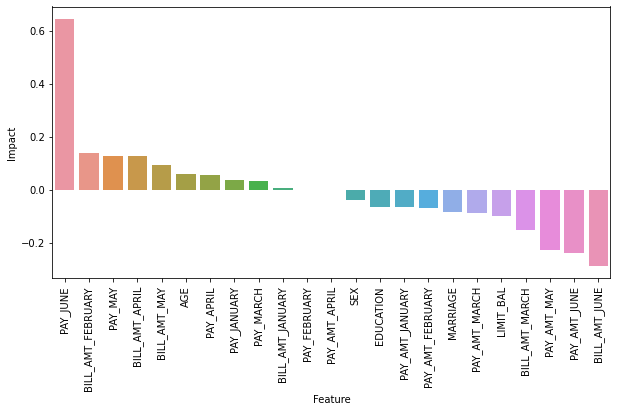

In [ ]:
#Impacts of features
feature_impacts = pd.DataFrame({'Feature': X.columns, 'Impact': logreg.coef_[0]})

#Plot feature impacts as waterfall plot
import seaborn as sns

fig = plt.figure(figsize=(10, 5))
sns.barplot(x='Feature', y='Impact', data=feature_impacts.sort_values(by='Impact', ascending=False))
plt.xticks(rotation=90)
plt.show()

From the waterfall plot, we can see that the most important features are the mostly pertaining to the **most recent (June)** repayment status of our customers. This is consistent with our previous analysis.

In [ ]:
#Show features with multicollinearity > 0.7
corr = X.corr()
corr = corr.abs().unstack().sort_values(ascending=False).reset_index()
corr = corr[corr['level_0'] != corr['level_1']]
corr = corr[corr[0] > 0.7]
corr

,level_0,level_1,0
23,BILL_AMT_JUNE,BILL_AMT_MAY,0.951969
24,BILL_AMT_MAY,BILL_AMT_JUNE,0.951969
25,BILL_AMT_JANUARY,BILL_AMT_FEBRUARY,0.948382
26,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,0.948382
27,BILL_AMT_MARCH,BILL_AMT_FEBRUARY,0.939537
28,BILL_AMT_FEBRUARY,BILL_AMT_MARCH,0.939537
29,BILL_AMT_MAY,BILL_AMT_APRIL,0.923996
30,BILL_AMT_APRIL,BILL_AMT_MAY,0.923996
31,BILL_AMT_MARCH,BILL_AMT_APRIL,0.917504
32,BILL_AMT_APRIL,BILL_AMT_MARCH,0.917504


Due to the high multicollinearity between the features, its better to consider tree based model for the MVM.

#### Logistic Regression: Most Important Features

In [ ]:
logreg_imp = LogisticRegression(random_state=42)

#Fit model
logreg_imp.fit(X_imp, y)
print("Accuracy of training set: {:.3f}".format(logreg_imp.score(X_imp, y)))


#Cross validate
scores = cross_val_score(logreg_imp, X_imp, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.810
Mean cross-val ROC_AUC:  0.7189160165893157


In [ ]:
y_pred_prob_lrimp = logreg_imp.predict_proba(X_imp)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_lrimp)))

AUC: 0.720


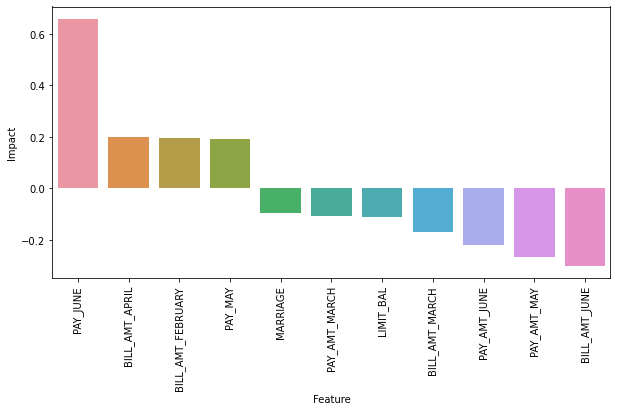

In [ ]:
#Impacts of features
feature_impacts = pd.DataFrame({'Feature': X_imp.columns, 'Impact': logreg_imp.coef_[0]})

#Plot feature impacts as waterfall plot
fig = plt.figure(figsize=(10, 5))
sns.barplot(x='Feature', y='Impact', data=feature_impacts.sort_values(by='Impact', ascending=False))
plt.xticks(rotation=90)
plt.show()

### Model 1: Decision Tree

In [ ]:
#Create model
dt = DecisionTreeClassifier(random_state=42)

#Fit model
dt.fit(X, y)
print("Accuracy of training set: {:.3f}".format(dt.score(X, y)))

#Cross validate
scores = cross_val_score(dt, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 1.000
Mean cross-val ROC_AUC:  0.6106530155263448


In [ ]:
y_pred_prob_dt = dt.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_dt)))

AUC: 1.000


In [ ]:
#Depth of current tree
print('Depth of current tree: ', dt.get_depth())

#Current number of leaves
print('Current number of leaves: ', dt.get_n_leaves())

Depth of current tree:  39
Current number of leaves:  3144


### Model 2: Decision Tree: Most Important Features

In [ ]:
dt_imp = DecisionTreeClassifier(random_state=42)

#Fit model
dt_imp.fit(X_imp, y)
print("ROC_AUC of training set: {:.3f}".format(dt_imp.score(X_imp, y)))

#Cross validate
scores = cross_val_score(dt_imp, X_imp, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

ROC_AUC of training set: 0.991
Mean cross-val ROC_AUC:  0.6124699405781864


In [ ]:
y_pred_prob_dtimp = dt_imp.predict_proba(X_imp)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_dtimp)))

AUC: 1.000


In [ ]:
#Depth of current tree
print('Depth of current tree: ', dt_imp.get_depth())

#Current number of leaves
print('Current number of leaves: ', dt_imp.get_n_leaves())

Depth of current tree:  47
Current number of leaves:  3419


### Model 3: Pruned Decision Tree (Most Important Features)

Since less features returned almost the same training accuracy but a better cross-val AUC, I'm considering the second Decision Tree for hyperparameter tuning

In [ ]:
#Create parameter grid
param_grid = {'max_depth': range(1, 50, 2)}

#Create grid search object: 
grid_search = GridSearchCV(dt_imp, param_grid, cv=10, scoring='roc_auc', return_train_score=True)

#Fit grid search
grid_search.fit(X_imp, y)

#Best parameters
print('Best parameters: ', grid_search.best_params_)

Best parameters:  {'max_depth': 5}


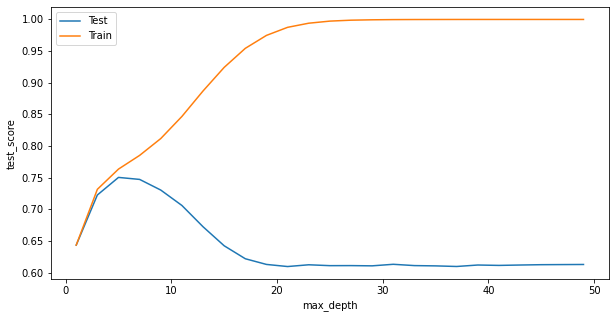

In [ ]:
#ROC_AUC score for different values of max_depth
results = pd.DataFrame(grid_search.cv_results_)
results = results[['param_max_depth', 'mean_test_score', 'mean_train_score']]
results.columns = ['max_depth', 'test_score', 'train_score']

#Plot ROC_AUC score for different values of max_depth
fig = plt.figure(figsize=(10, 5))
sns.lineplot(x='max_depth', y='test_score', data=results, label='Test')
sns.lineplot(x='max_depth', y='train_score', data=results, label='Train')
plt.show()

In [ ]:
#Create model with best parameters
dt_pruned = DecisionTreeClassifier(max_depth=grid_search.best_params_['max_depth'], random_state=42)

#Fit model
dt_pruned.fit(X_imp, y)
print("Accuracy of training set: {:.3f}".format(dt_pruned.score(X_imp, y)))

#Cross validate
scores = cross_val_score(dt_pruned, X_imp, y, cv=10, scoring='roc_auc')
print('Mean ROC_AUC: ', scores.mean())

Accuracy of training set: 0.823
Mean ROC_AUC:  0.7504453731724742


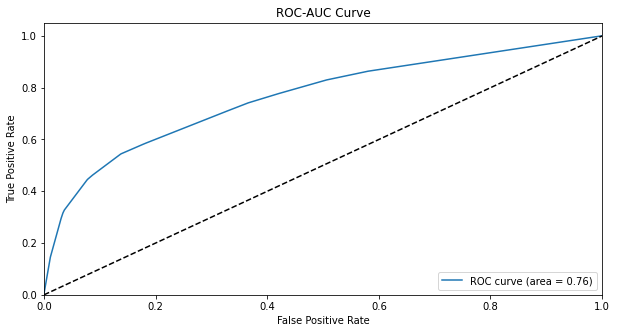

In [ ]:
y_pred_prob_dtp = dt_pruned.predict_proba(X_imp)[:, 1]

fpr, tpr, thresholds = roc_curve(y, y_pred_prob_dtp)

roc_auc = auc(fpr, tpr)

#Plot ROC-AUC curve
fig = plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
y_pred_prob_dtp = dt_pruned.predict_proba(X_imp)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_dtp)))

AUC: 0.764


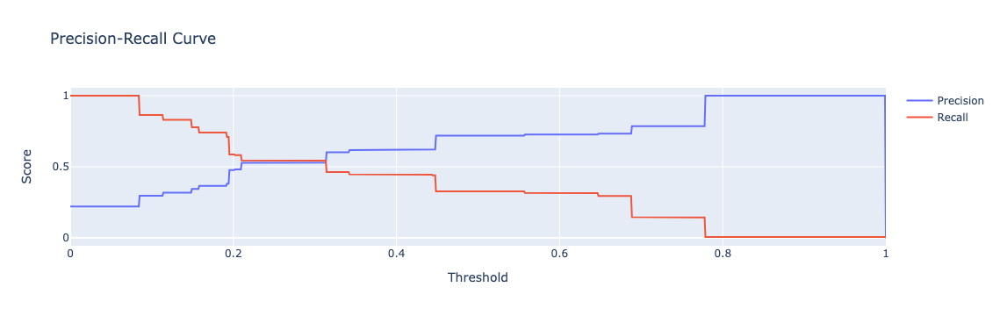

In [ ]:
thresholds = np.linspace(0,1,1000)

precs = []
recs = []
for th in thresholds:
    precs.append(precision_score(y, y_pred_prob_dtp > th))
    recs.append(recall_score(y, y_pred_prob_dtp > th))

#Plot Precision-Recall curve
fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=precs, name='Precision'))
fig.add_trace(go.Scatter(x=thresholds, y=recs, name='Recall'))
fig.update_layout(title='Precision-Recall Curve', xaxis_title='Threshold', yaxis_title='Score')
fig.show()

For the pruned Decision Tree with most important features, we get an AUC of **0.764**. While overfitting has reduced considerably, we can try to reduce overfitting by using a Random Forest model/bagging. This may also help increase the ROC_AUC

### Model 4: Random Forest (Bagging)

In [ ]:
#Create model
rf = RandomForestClassifier(random_state=42, max_features=len(X.columns))

#Fit model
rf.fit(X, y)
print("Accuracy of training set: {:.3f}".format(rf.score(X, y)))

#Cross validate
scores = cross_val_score(rf, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 1.000
Mean cross-val ROC_AUC:  0.7562074884263966


In [ ]:
y_pred_prob_rf = rf.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_rf)))

AUC: 1.000


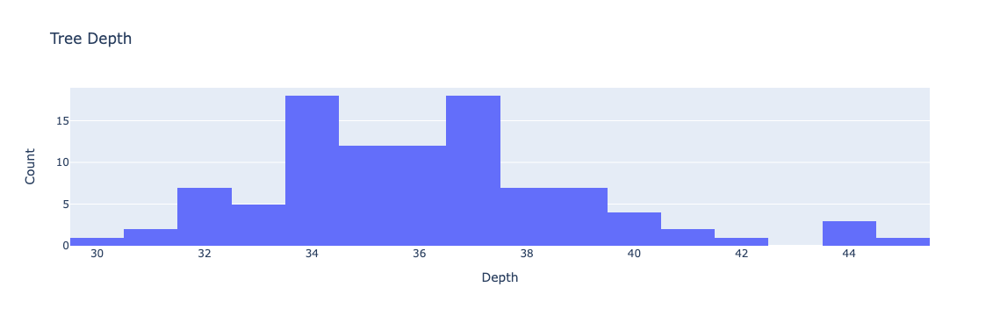

In [ ]:
#Tree depth
tree_depths = []
for tree in rf.estimators_:
    tree_depths.append(tree.tree_.max_depth)

#Plot tree depth
fig = go.Figure()
fig.add_trace(go.Histogram(x=tree_depths, name='Tree Depth'))
fig.update_layout(title='Tree Depth', xaxis_title='Depth', yaxis_title='Count')
fig.show()

From the above results, we can see that the Random Forest model is overfitting the data. We can try to reduce overfitting by limiting the number of features

### Model 5: Random Forest (Most Important Features)

In [ ]:
rf_imp = RandomForestClassifier(random_state=42, max_features=len(X_imp.columns))

#Fit model
rf_imp.fit(X_imp, y)
print("Accuracy of training set: {:.3f}".format(rf_imp.score(X_imp, y)))

#Cross validate
scores = cross_val_score(rf_imp, X_imp, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.991
Mean cross-val ROC_AUC:  0.74050637782515


In [ ]:
y_pred_prob_rfimp = rf_imp.predict_proba(X_imp)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_rfimp)))

AUC: 0.999


### Model 6: Hyperparameter Tuning of Random Forest (Model 4)

In [ ]:
#Create parameter grid
param_grid = {'max_features': [range(1,len(X.columns)), 'sqrt'], 'max_depth': range(1, 50, 5)}

#Create grid search object
grid_search = GridSearchCV(rf, param_grid, cv=10, scoring='roc_auc', return_train_score=True)

#Fit grid search
grid_search.fit(X, y)   

#Best parameters
print('Best parameters: ', grid_search.best_params_)

Best parameters:  {'max_depth': 11, 'max_features': 'sqrt'}


In [ ]:
#Create model with best parameters
rf_pruned = RandomForestClassifier(random_state=42, max_features=grid_search.best_params_['max_features'], max_depth=grid_search.best_params_['max_depth'])

#Fit model
rf_pruned.fit(X, y)
print("Accuracy of training set: {:.3f}".format(rf_pruned.score(X, y)))

#Cross validate
scores = cross_val_score(rf_pruned, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.870
Mean cross-val ROC_AUC:  0.7773076051789334


In [ ]:
y_pred_prob_rfp = rf_pruned.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_rfp)))

AUC: 0.890


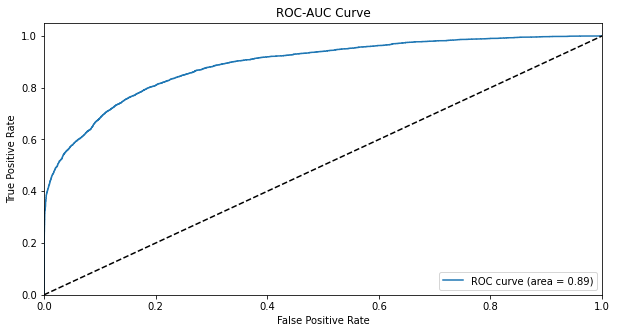

AUC: 0.890


In [ ]:
y_pred_prob_rfp = rf_pruned.predict_proba(X)[:, 1]

fpr, tpr, thresholds = roc_curve(y, y_pred_prob_rfp)

roc_auc = auc(fpr, tpr)

#Plot ROC-AUC curve
fig = plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve')
plt.legend(loc="lower right")
plt.show()

print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_rfp)))

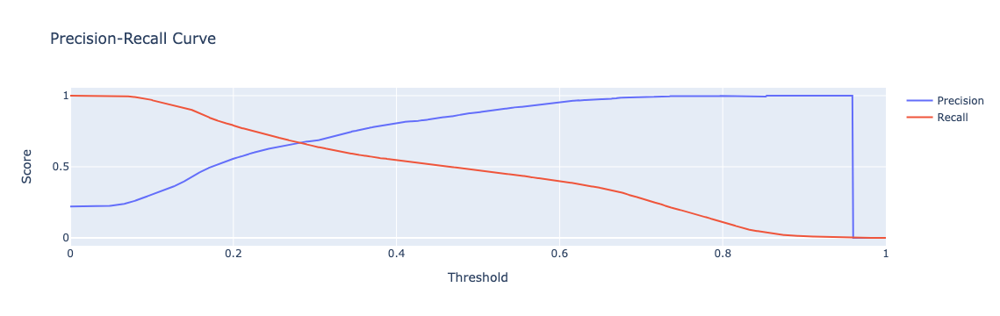

Precision: 0.882
Recall: 0.477
F1 Score: 0.619


In [ ]:
thresholds = np.linspace(0,1,1000)

precs = []
recs = []
for th in thresholds:
    precs.append(precision_score(y, y_pred_prob_rfp > th))
    recs.append(recall_score(y, y_pred_prob_rfp > th))

#Plot Precision-Recall curve
fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=precs, name='Precision'))
fig.add_trace(go.Scatter(x=thresholds, y=recs, name='Recall'))
fig.update_layout(title='Precision-Recall Curve', xaxis_title='Threshold', yaxis_title='Score')
fig.show()

print("Precision: {:.3f}".format(precision_score(y, y_pred_prob_rfp > 0.5)))
print("Recall: {:.3f}".format(recall_score(y, y_pred_prob_rfp > 0.5)))
print("F1 Score: {:.3f}".format(f1_score(y, y_pred_prob_rfp > 0.5)))

The AUC of the pruned Random Forest model is **0.89**. This is a good improvement over the previous model.
The Precision, Recall and F1 score are also better than the Decision Tree model.

### Model 7: XGBoost

In [ ]:
#Create model
xgb = XGBClassifier(random_state=42)

#Fit model
xgb.fit(X, y)
print("Accuracy of training set: {:.3f}".format(xgb.score(X, y)))

#Cross validate
scores = cross_val_score(xgb, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.893
Mean cross-val ROC_AUC:  0.7589619189237856


In [ ]:
y_pred_prob_xgb = xgb.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_xgb)))

AUC: 0.952


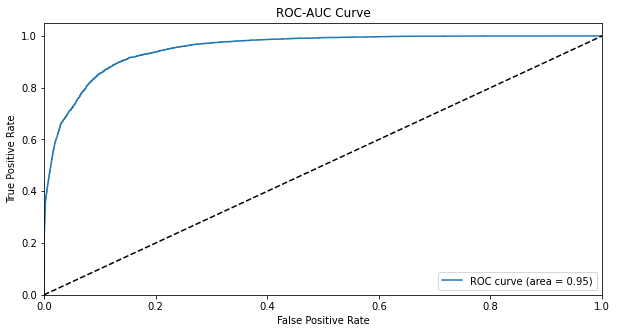

AUC: 0.952


In [ ]:
y_pred_prob_xgb = xgb.predict_proba(X)[:, 1]

fpr, tpr, thresholds = roc_curve(y, y_pred_prob_xgb)

roc_auc = auc(fpr, tpr)

#Plot ROC-AUC curve
fig = plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve')
plt.legend(loc="lower right")
plt.show()

print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_xgb)))

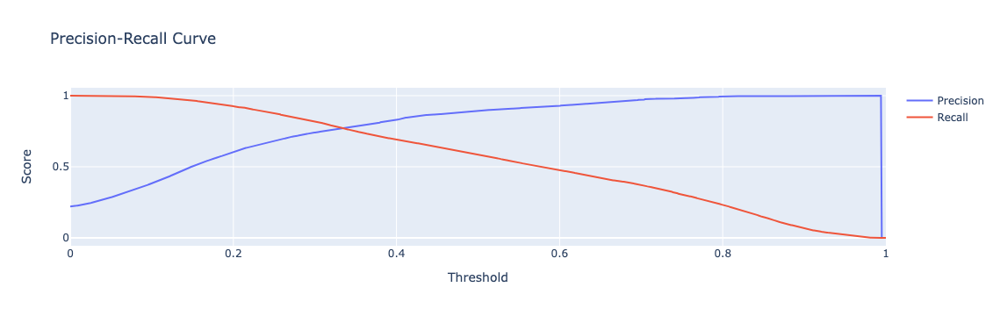

Precision: 0.896
Recall: 0.584
F1 Score: 0.707


In [ ]:
thresholds = np.linspace(0,1,1000)

precs = []
recs = []

for th in thresholds:
    precs.append(precision_score(y, y_pred_prob_xgb > th))
    recs.append(recall_score(y, y_pred_prob_xgb > th))

#Plot Precision-Recall curve
fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=precs, name='Precision'))
fig.add_trace(go.Scatter(x=thresholds, y=recs, name='Recall'))
fig.update_layout(title='Precision-Recall Curve', xaxis_title='Threshold', yaxis_title='Score')
fig.show()

print("Precision: {:.3f}".format(precision_score(y, y_pred_prob_xgb > 0.5)))
print("Recall: {:.3f}".format(recall_score(y, y_pred_prob_xgb > 0.5)))
print("F1 Score: {:.3f}".format(f1_score(y, y_pred_prob_xgb > 0.5)))

### Model 8: Hyperparameter Tuning of XGBoost
Since XGBoost does Feature Selection to an extent, running the model with X and not X_imp

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, shuffle=True)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((16000, 23), (4000, 23), (16000,), (4000,))

In [ ]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0}

def objective(space):
    clf=XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))

    evaluation = [(X_train, y_train), (X_test, y_test)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

In [ ]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.8861433926361753, 'gamma': 2.8160015766229627, 'max_depth': 16.0, 'min_child_weight': 3.0, 'reg_alpha': 47.0, 'reg_lambda': 0.7763794967262305}


In [ ]:
#Create model

#xgb_opt = XGBClassifier(colsample_bytree = best_hyperparams['colsample_bytree'],
                        #gamma = best_hyperparams['gamma'],
                        #max_depth = int(best_hyperparams['max_depth']),
                        #min_child_weight = int(best_hyperparams['min_child_weight']),
                        #reg_alpha = best_hyperparams['reg_alpha'],
                        #reg_lambda = best_hyperparams['reg_lambda'],
                        #random_state=42)
                        
xgb_opt = XGBClassifier(colsample_bytree = 0.5669229660713853,
                        gamma = 4.631524172672042,
                        max_depth = 6,
                        min_child_weight = 8,
                        reg_alpha = 41.0,
                        reg_lambda = 0.07161962939036481,
                        random_state=42)

#Fit model
xgb_opt.fit(X, y)
print("Accuracy of training set: {:.3f}".format(xgb_opt.score(X, y)))

#Cross validate
scores = cross_val_score(xgb_opt, X, y, cv=10, scoring='roc_auc')
print('Mean cross-val ROC_AUC: ', scores.mean())

Accuracy of training set: 0.823
Mean cross-val ROC_AUC:  0.7790723981900453


In [ ]:
y_pred_prob_xgbo = xgb_opt.predict_proba(X)[:, 1]
print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_xgbo)))

AUC: 0.788


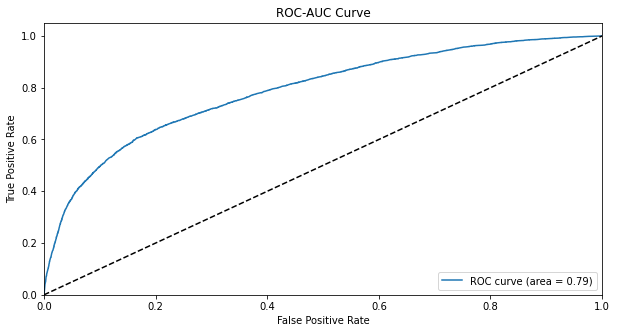

AUC: 0.788


In [ ]:
y_pred_prob_5 = xgb_opt.predict_proba(X)[:, 1]

fpr, tpr, thresholds = roc_curve(y, y_pred_prob_5)

roc_auc = auc(fpr, tpr)

#Plot ROC-AUC curve
fig = plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve')
plt.legend(loc="lower right")
plt.show()

print("AUC: {:.3f}".format(roc_auc_score(y, y_pred_prob_5)))

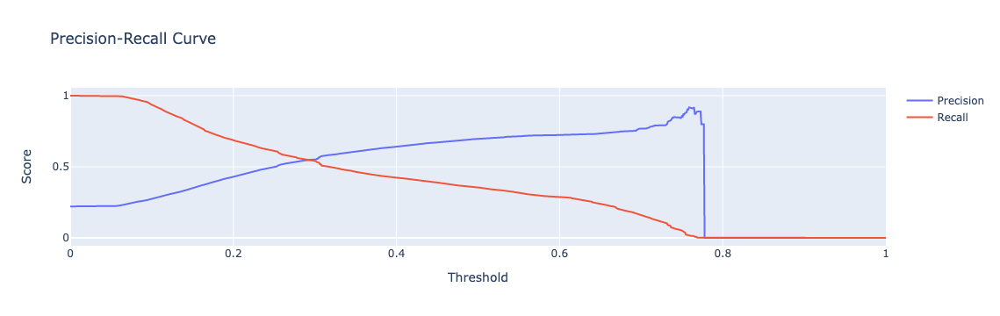

Precision: 0.695
Recall: 0.355
F1 Score: 0.470


In [ ]:
thresholds = np.linspace(0,1,1000)

precs = []
recs = []

for th in thresholds:
    precs.append(precision_score(y, y_pred_prob_5 > th))
    recs.append(recall_score(y, y_pred_prob_5 > th))

#Plot Precision-Recall curve
fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=precs, name='Precision'))
fig.add_trace(go.Scatter(x=thresholds, y=recs, name='Recall'))
fig.update_layout(title='Precision-Recall Curve', xaxis_title='Threshold', yaxis_title='Score')
fig.show()

print("Precision: {:.3f}".format(precision_score(y, y_pred_prob_5 > 0.5)))
print("Recall: {:.3f}".format(recall_score(y, y_pred_prob_5 > 0.5)))
print("F1 Score: {:.3f}".format(f1_score(y, y_pred_prob_5 > 0.5)))

## Testing the Models

In [ ]:
#Test data
test_data = pd.read_csv('test_data.csv')
test_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_JUNE,PAY_MAY,PAY_APRIL,PAY_MARCH,...,BILL_AMT_MARCH,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MAY,PAY_AMT_APRIL,PAY_AMT_MARCH,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,DEFAULT_JULY
0,11316,170000.0,1,2,2,36,-2,-2,-2,-2,...,1340.0,0.0,0.0,1598.0,0.0,1340.0,0.0,0.0,3200.0,0
1,26420,120000.0,1,2,2,25,0,0,2,0,...,3345.0,2929.0,2520.0,2446.0,438.0,1000.0,0.0,7.0,0.0,0
2,7847,250000.0,2,1,2,38,-1,-1,-1,-1,...,15410.0,1276.0,0.0,990.0,8150.0,15410.0,1276.0,0.0,0.0,0
3,8083,100000.0,1,1,1,55,0,0,0,0,...,17158.0,18758.0,17168.0,8000.0,2000.0,4000.0,2000.0,3000.0,0.0,0
4,7455,30000.0,1,1,2,56,2,0,0,0,...,29313.0,29019.0,28916.0,1480.0,1448.0,1021.0,1040.0,1216.0,1270.0,0


In [ ]:
#Split into X and y
X_test = test_data.drop(['ID','DEFAULT_JULY'], axis=1)
X_test = scaler.transform(X_test)
X_test = pd.DataFrame(X_test, columns=X.columns)

X_test_imp = X_test[imp_feat]
X_test_imp = pd.DataFrame(X_test_imp, columns=X_imp.columns)

y_test = test_data['DEFAULT_JULY']

In [ ]:
dfs = []

models1 = [
          ('Model 0a: LogReg', logreg),
          #('Model 0b: LogReg (Important Features)', logreg_imp),
          ('Model 1: Decision Tree', dt),
          #('Model 2: Decision Tree (Important Features)', dt_imp),
          #('Model 3: Pruned Decision Tree (Important Features)', dt_pruned),
          ('Model 4: Random Forest', rf),
          #('Model 5: Random Forest (Important Features)', rf_imp),
          ('Model 6: Pruned Random Forest', rf_pruned),
          ('Model 7: XGBoost', xgb),
          ('Model 8: Optimized XGBoost', xgb_opt)
        ]

results = []
names = []
scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
target_names = ['Non-Default','Default']

for name, model in models1:
    kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=90210)
    cv_results = model_selection.cross_validate(model, X, y, cv=kfold, scoring=scoring)
    clf = model.fit(X, y)
    y_pred = clf.predict(X_test)
    print(name)
    print(classification_report(y_test, y_pred, target_names=target_names))
    results.append(cv_results)
    names.append(name)
    this_df = pd.DataFrame(cv_results)
    this_df['model'] = name
    dfs.append(this_df)

models2 = [
          #('Model 0a: LogReg', logreg),
          ('Model 0b: LogReg (Important Features)', logreg_imp),
          #('Model 1: Decision Tree', dt),
          ('Model 2: Decision Tree (Important Features)', dt_imp),
          ('Model 3: Pruned Decision Tree (Important Features)', dt_pruned),
          #('Model 4: Random Forest', rf),
          ('Model 5: Random Forest (Important Features)', rf_imp),
          #('Model 6: Pruned Random Forest', rf_pruned)
          #('Model 7: XGBoost', xgb),
          #('Model 8: Optimized XGBoost', xgb_opt)
        ]

for name, model in models2:
    kfold = model_selection.KFold(n_splits=10, shuffle=True, random_state=90210)
    cv_results = model_selection.cross_validate(model, X_imp, y, cv=kfold, scoring=scoring)
    clf = model.fit(X_imp, y)
    y_pred = clf.predict(X_test_imp)
    print(name)
    print(classification_report(y_test, y_pred, target_names=target_names))
    results.append(cv_results)
    names.append(name)
    this_df = pd.DataFrame(cv_results)
    this_df['model'] = name
    dfs.append(this_df)

final = pd.concat(dfs, ignore_index=True)

Model 0a: LogReg
              precision    recall  f1-score   support

 Non-Default       0.69      0.04      0.07      7005
     Default       0.22      0.94      0.35      1995

    accuracy                           0.24      9000
   macro avg       0.45      0.49      0.21      9000
weighted avg       0.59      0.24      0.13      9000

Model 1: Decision Tree
              precision    recall  f1-score   support

 Non-Default       0.80      0.64      0.71      7005
     Default       0.26      0.44      0.33      1995

    accuracy                           0.59      9000
   macro avg       0.53      0.54      0.52      9000
weighted avg       0.68      0.59      0.63      9000

Model 4: Random Forest
              precision    recall  f1-score   support

 Non-Default       0.78      0.93      0.85      7005
     Default       0.28      0.09      0.14      1995

    accuracy                           0.75      9000
   macro avg       0.53      0.51      0.49      9000
weighted av

In [ ]:
bootstraps = []

for model in list(set(final.model.values)):
    model_df = final.loc[final.model == model]
    bootstrap = model_df.sample(n=30, replace=True)
    bootstraps.append(bootstrap)

bootstrap_df = pd.concat(bootstraps, ignore_index=True)
results_long = pd.melt(bootstrap_df,id_vars=['model'],var_name='metrics', value_name='values')
time_metrics = ['fit_time','score_time'] # fit time metrics

# PERFORMANCE METRICS
results_long_nofit = results_long.loc[~results_long['metrics'].isin(time_metrics)] # get df without fit data
results_long_nofit = results_long_nofit.sort_values(by='values')

# TIME METRICS
results_long_fit = results_long.loc[results_long['metrics'].isin(time_metrics)] # df with fit data
results_long_fit = results_long_fit.sort_values(by='values')

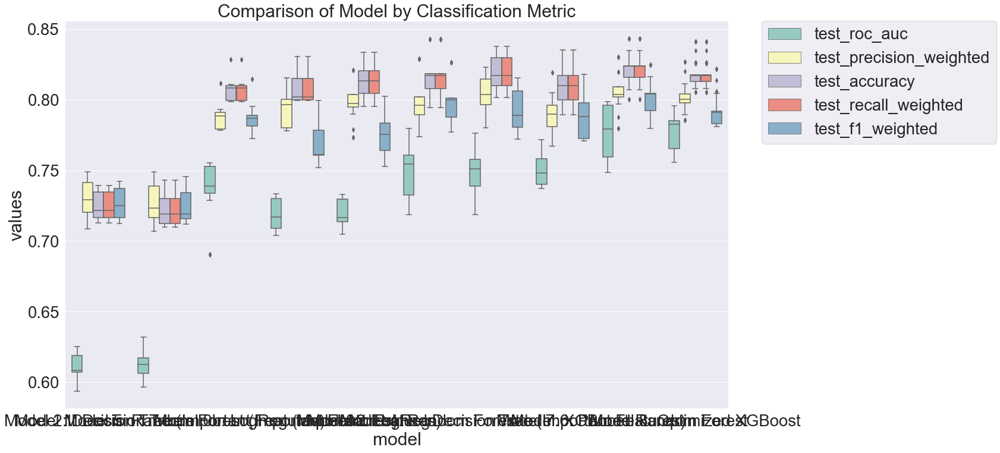

In [ ]:
plt.figure(figsize=(20, 12))
sns.set(font_scale=2.5)
g = sns.boxplot(x="model", y="values", hue="metrics", data=results_long_nofit, palette="Set3")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Comparison of Model by Classification Metric')
plt.savefig('./benchmark_models_performance.png',dpi=300)

In [ ]:
metrics = list(set(results_long_nofit.metrics.values))
bootstrap_df.groupby(['model'])[metrics].agg([np.std, np.mean])

test_precision_weighted  \
                                                                       std   
model                                                                        
Model 0a: LogReg                                                  0.011203   
Model 0b: LogReg (Important Features)                             0.010535   
Model 1: Decision Tree                                            0.013602   
Model 2: Decision Tree (Important Features)                       0.014020   
Model 3: Pruned Decision Tree (Important Features)                0.013182   
Model 4: Random Forest                                            0.016963   
Model 5: Random Forest (Important Features)                       0.008808   
Model 6: Pruned Random Forest                                     0.012915   
Model 7: XGBoost                                                  0.012805   
Model 8: Optimized XGBoost                                        0.011543   

                                                              \
                                                        mean   
model                                                          
Model 0a: LogReg                                    0.797975   
Model 0b: LogReg (Important Features)               0.792607   
Model 1: Decision Tree                              0.728540   
Model 2: Decision Tree (Important Features)         0.726641   
Model 3: Pruned Decision Tree (Important Features)  0.803101   
Model 4: Random Forest                              0.801474   
Model 5: Random Forest (Important Features)         0.787198   
Model 6: Pruned Random Forest                       0.806547   
Model 7: XGBoost                                    0.788477   
Model 8: Optimized XGBoost                          0.801875   

                                                   test_recall_weighted  \
                                                                    std   
model                                                                     
Model 0a: LogReg                                               0.010409   
Model 0b: LogReg (Important Features)                          0.008242   
Model 1: Decision Tree                                         0.009652   
Model 2: Decision Tree (Important Features)                    0.011580   
Model 3: Pruned Decision Tree (Important Features)             0.011691   
Model 4: Random Forest                                         0.015094   
Model 5: Random Forest (Important Features)                    0.007859   
Model 6: Pruned Random Forest                                  0.011629   
Model 7: XGBoost                                               0.011826   
Model 8: Optimized XGBoost                                     0.010303   

                                                             test_roc_auc  \
                                                        mean          std   
model                                                                       
Model 0a: LogReg                                    0.813350     0.009501   
Model 0b: LogReg (Important Features)               0.806800     0.009765   
Model 1: Decision Tree                              0.724683     0.010184   
Model 2: Decision Tree (Important Features)         0.722550     0.011184   
Model 3: Pruned Decision Tree (Important Features)  0.818867     0.017402   
Model 4: Random Forest                              0.818933     0.021637   
Model 5: Random Forest (Important Features)         0.806400     0.023459   
Model 6: Pruned Random Forest                       0.822750     0.017581   
Model 7: XGBoost                                    0.808617     0.009823   
Model 8: Optimized XGBoost                          0.817967     0.014533   

                                                             test_f1_weighted  \
                                                        mean              std   
model                                                          

#### The final model is Model 7: XGBoost with AUC (for training data): 0.952 and AUC (for test data): 0.754 (std 0.013014)
The hyperparameter tuned random forest has a higher mean accuracy and f1 but as we can see from the classification report, the precision, recall, and thus the f1 score for <em>Default</em> classification are much lower than that of XGBoost. Same goes for the the Optimized XGBoost.

In [ ]:
filename = 'final_default_predictor.sav'
pickle.dump(xgb, open(filename, 'wb'))

In [1]:
#filename = 'logreg.sav'
#pickle.dump(logreg, open(filename, 'wb'))

#filename = 'logreg_imp.sav'
#pickle.dump(logreg_imp, open(filename, 'wb'))

#filename = 'dt.sav'
#pickle.dump(dt, open(filename, 'wb'))

#filename = 'dt_imp.sav'
#pickle.dump(dt_imp, open(filename, 'wb'))

#filename = 'dt_pruned.sav'
#pickle.dump(dt_pruned, open(filename, 'wb'))

#filename = 'rf.sav'
#pickle.dump(rf, open(filename, 'wb'))

#filename = 'rf_imp.sav'
#pickle.dump(rf_imp, open(filename, 'wb'))

#filename = 'rf_pruned.sav'
#pickle.dump(rf_pruned, open(filename, 'wb'))

#filename = 'xgb.sav'
#pickle.dump(xgb, open(filename, 'wb'))

#filename = 'xgb_opt.sav'
#pickle.dump(xgb_opt, open(filename, 'wb'))

### Which five of 1000 clients from the submission set are most likely to repay the loan if it were granted?

In [ ]:
#Submission features
sub_data = pd.read_csv('submission_features.csv')
sub_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_JUNE,PAY_MAY,PAY_APRIL,PAY_MARCH,...,BILL_AMT_APRIL,BILL_AMT_MARCH,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MAY,PAY_AMT_APRIL,PAY_AMT_MARCH,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY
0,2774,70000.0,2,3,2,22,0,0,0,0,...,37858.0,29660.0,29519.0,29457.0,1726.0,3028.0,1026.0,1195.0,1060.0,1031.0
1,15339,100000.0,2,2,1,38,1,2,0,0,...,15323.0,16268.0,15868.0,16448.0,0.0,1600.0,1500.0,0.0,1000.0,1500.0
2,26485,140000.0,2,1,2,40,1,2,0,0,...,128285.0,123074.0,97382.0,99364.0,0.0,6601.0,5522.0,3200.0,3300.0,3500.0
3,6657,380000.0,2,2,2,27,0,0,-1,0,...,270219.0,3641.0,3717.0,3791.0,0.0,270219.0,131.0,135.0,136.0,76.0
4,7917,100000.0,1,2,2,26,0,0,0,0,...,33680.0,34419.0,37782.0,76185.0,2000.0,2000.0,2000.0,4500.0,40000.0,3000.0


In [ ]:
#Drop ID
sub_data.drop('ID', axis=1, inplace=True)

In [ ]:
#Load data
train_data = pd.read_csv("ROYSAHANA_A_train.csv")

In [ ]:
#Drop ID
train_data.drop('ID', axis=1, inplace=True)

In [ ]:
#Split data into X and y
X = train_data.drop('DEFAULT_JULY', axis=1)
y = train_data['DEFAULT_JULY']

In [ ]:
#Scale data
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=train_data.drop('DEFAULT_JULY', axis=1).columns)
X.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,BILL_AMT_MARCH,...,PAY_JANUARY,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY
count,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,...,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04,2.000000e+04
mean,-5.044853e-17,1.925571e-16,4.929390e-17,1.588063e-16,-2.870593e-16,-5.258016e-17,-7.105427e-19,-1.705303e-17,-3.410605e-17,-1.065814e-17,...,2.167155e-17,2.096101e-17,3.410605e-17,-1.634248e-17,8.526513e-18,-3.730349e-18,2.415845e-17,-1.909584e-17,1.953993e-17,1.421085e-17
std,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,...,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00
min,-1.217036e+00,-1.239671e+00,-2.341231e+00,-2.968295e+00,-1.570261e+00,-2.926187e+00,-1.996316e+00,-1.885595e+00,-2.927265e+00,-3.301701e+00,...,-1.492180e+00,-1.767840e+00,-1.523328e+00,-1.561144e+00,-2.855653e-01,-3.094928e-01,-3.097193e-01,-3.384353e-01,-3.028724e-01,-2.522697e-01
25%,-9.088370e-01,-1.239671e+00,-1.078329e+00,-1.053328e+00,-8.119060e-01,-6.367135e-01,-6.331002e-01,-6.299371e-01,-6.457073e-01,-6.350165e-01,...,-6.190751e-01,-8.761175e-01,-6.648491e-01,-7.242713e-01,-2.643734e-01,-2.908498e-01,-3.000550e-01,-2.794114e-01,-2.839088e-01,-2.164058e-01
50%,-2.153894e-01,8.066659e-01,1.845731e-01,8.616396e-01,-1.618872e-01,-3.841512e-01,-3.622704e-01,-3.644908e-01,-3.907668e-01,-3.755948e-01,...,2.540299e-01,1.560515e-02,1.936300e-01,1.126012e-01,-1.881682e-01,-2.133121e-01,-2.179692e-01,-2.143361e-01,-2.102163e-01,-1.658438e-01
75%,5.551078e-01,8.066659e-01,1.845731e-01,8.616396e-01,6.235522e-01,1.818522e-01,1.606134e-01,1.683977e-01,2.152498e-01,1.717715e-01,...,2.540299e-01,1.560515e-02,1.936300e-01,1.126012e-01,-3.950388e-02,-5.068661e-02,-6.505245e-02,-4.176619e-02,-5.243858e-02,-3.738674e-02
max,6.410887e+00,8.066659e-01,5.236181e+00,2.776607e+00,4.713254e+00,2.314677e+01,1.453767e+01,1.541149e+01,1.231483e+01,1.311892e+01,...,7.238870e+00,7.149387e+00,7.061463e+00,5.970708e+00,4.766590e+01,2.703974e+01,2.678719e+01,5.123488e+01,3.805672e+01,7.213146e+01


In [ ]:
#Scale test data
sub_data = scaler.fit_transform(sub_data)
sub_data = pd.DataFrame(sub_data, columns=train_data.drop('DEFAULT_JULY', axis=1).columns)
sub_data.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,BILL_AMT_MARCH,...,PAY_JANUARY,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY
count,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,...,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1000.000000,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03
mean,6.039613e-17,-2.291500e-16,-2.309264e-17,7.815970e-17,-2.238210e-16,1.065814e-17,-2.131628e-17,1.421085e-17,-5.329071e-17,4.263256e-17,...,-7.105427e-18,-1.776357e-17,-2.842171e-17,1.776357e-17,3.286260e-17,0.000000,-2.131628e-17,-2.842171e-17,-2.131628e-17,3.197442e-17
std,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,...,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00
min,-1.215106e+00,-1.204566e+00,-1.059671e+00,-2.945780e+00,-1.633939e+00,-1.738197e+00,-1.550626e+00,-1.543755e+00,-1.488806e+00,-1.495299e+00,...,-7.626185e-01,-7.807946e-01,-8.976353e-01,-1.625289e+00,-4.316448e-01,-0.359871,-3.630766e-01,-3.080054e-01,-2.982622e-01,-3.118776e-01
25%,-8.329193e-01,-1.204566e+00,-1.059671e+00,-1.041591e+00,-7.547682e-01,-8.742818e-01,-7.280130e-01,-7.043016e-01,-6.528679e-01,-6.393751e-01,...,-6.838818e-01,-6.755471e-01,-6.792835e-01,-6.816138e-01,-3.465835e-01,-0.309956,-3.392899e-01,-2.953130e-01,-2.917931e-01,-3.027795e-01
50%,-1.832024e-01,8.301742e-01,1.739391e-01,8.625974e-01,-2.052864e-01,-1.036698e-02,9.460055e-02,1.351520e-01,1.830705e-01,2.165487e-01,...,-4.065524e-01,-3.916065e-01,-4.004375e-01,-4.012614e-01,-2.536114e-01,-0.239227,-2.288572e-01,-2.126936e-01,-2.067184e-01,-2.208959e-01
75%,5.429518e-01,8.301742e-01,1.739391e-01,8.625974e-01,6.738845e-01,-1.036698e-02,9.460055e-02,1.351520e-01,1.830705e-01,2.165487e-01,...,2.379155e-01,2.043026e-01,1.899941e-01,2.265927e-01,6.995275e-03,-0.053292,-2.624176e-02,-4.875721e-02,-5.393170e-02,-5.712882e-02
max,4.670565e+00,8.301742e-01,5.108380e+00,2.766786e+00,3.641086e+00,6.900952e+00,5.852895e+00,6.011327e+00,6.034639e+00,6.208015e+00,...,5.678927e+00,5.715022e+00,5.951208e+00,6.093034e+00,2.036586e+01,15.573831,1.410600e+01,2.002569e+01,1.818279e+01,1.487600e+01


In [ ]:
#Loading model
predictor = pickle.load(open('final_default_predictor.sav', 'rb'))

prediction = predictor.predict(sub_data)
prediction

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0,

In [ ]:
y_pred_prob = predictor.predict_proba(sub_data)[:, 1]
y_pred_prob

array([0.31388906, 0.5766263 , 0.24398118, 0.04074139, 0.1632502 ,
       0.23980431, 0.29467502, 0.04204748, 0.5794943 , 0.01087266,
       0.10845578, 0.13730034, 0.22243567, 0.6491373 , 0.69929796,
       0.01760478, 0.16150518, 0.49241692, 0.52337116, 0.02967673,
       0.1772816 , 0.04769835, 0.5978778 , 0.1508749 , 0.03871363,
       0.7267786 , 0.05359629, 0.2557318 , 0.38628492, 0.67296624,
       0.42102686, 0.23487027, 0.793245  , 0.4186679 , 0.41443872,
       0.84345967, 0.29093546, 0.52946746, 0.21691231, 0.06500069,
       0.40031075, 0.06208703, 0.39187053, 0.4938026 , 0.3163899 ,
       0.9339762 , 0.03812361, 0.609793  , 0.12025461, 0.42612678,
       0.70747805, 0.6108587 , 0.53709644, 0.67137223, 0.3608649 ,
       0.30158517, 0.53962487, 0.07232894, 0.12307717, 0.21451524,
       0.02411401, 0.4266258 , 0.29198834, 0.49048042, 0.15805031,
       0.33875147, 0.415282  , 0.04300375, 0.09782926, 0.40892062,
       0.5224522 , 0.25271747, 0.11422914, 0.2166422 , 0.13413

In [ ]:
#Predictions mapped to ID
data = pd.read_csv('submission_features.csv')

data['prediction'] = prediction
data['probability'] = y_pred_prob
data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_JUNE,PAY_MAY,PAY_APRIL,PAY_MARCH,...,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MAY,PAY_AMT_APRIL,PAY_AMT_MARCH,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,prediction,probability
0,2774,70000.0,2,3,2,22,0,0,0,0,...,29519.0,29457.0,1726.0,3028.0,1026.0,1195.0,1060.0,1031.0,0,0.313889
1,15339,100000.0,2,2,1,38,1,2,0,0,...,15868.0,16448.0,0.0,1600.0,1500.0,0.0,1000.0,1500.0,1,0.576626
2,26485,140000.0,2,1,2,40,1,2,0,0,...,97382.0,99364.0,0.0,6601.0,5522.0,3200.0,3300.0,3500.0,0,0.243981
3,6657,380000.0,2,2,2,27,0,0,-1,0,...,3717.0,3791.0,0.0,270219.0,131.0,135.0,136.0,76.0,0,0.040741
4,7917,100000.0,1,2,2,26,0,0,0,0,...,37782.0,76185.0,2000.0,2000.0,2000.0,4500.0,40000.0,3000.0,0,0.163250


In [ ]:
#Export only ID and probability
data[['ID', 'probability']].to_csv('RoySahana_C1_submission.csv', index=False)

In [ ]:
#Top 5 potential non-defaulters (i.e. least probability of default)
top_5 = np.argsort(y_pred_prob)[:5]
top_5

array([591, 761, 901, 933, 353])

In [ ]:
#Find client IDs and default probability for top 5 potential non-defaulters
for i in top_5:
    print('Client ID: ', data.iloc[i, 0], 'Default Probability: ', y_pred_prob[i])

Client ID:  13492 Default Probability:  0.002912318
Client ID:  24289 Default Probability:  0.0033327956
Client ID:  15943 Default Probability:  0.0035406726
Client ID:  29493 Default Probability:  0.0042135348
Client ID:  17365 Default Probability:  0.005398606


### What's the best threshold we should consider to maximize the profit?

Now the bank wants to optimize the decision-making process by establishing the optimal threshold for the model in order to effectively take the decision about when to issue the credit and when not. 

So, taking into account the following numbers:
1. A customer who received a loan but does not repay costs 5000 to the bank
2. A customer who receives a loan and repays, make a profit of 1000 to the bank
3. If the credit is not issued, then there is no profit or loss

<center><img src="https://static.packt-cdn.com/products/9781838555078/graphics/C13314_06_05.jpg" width="500"/></center>

In [ ]:
#binclass-tools
!pip install binclass-tools
##https://github.com/lucazav/binclass-tools

In [ ]:
import bctools as bc

In [ ]:
#Import training data
train_data = pd.read_csv('ROYSAHANA_A_train.csv')
train_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,BILL_AMT_APRIL,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,BILL_AMT_JUNE,...,PAY_JUNE,PAY_MARCH,PAY_MAY,PAY_AMT_APRIL,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MARCH,PAY_AMT_MAY,DEFAULT_JULY
0,9910,130000.0,2,2,1,27,81231.0,83773.0,85532.0,76885.0,...,0.0,0.0,0.0,3000.0,3260.0,3200.0,3500.0,3146.0,4000.0,0
1,15561,60000.0,2,3,1,48,8422.0,3910.0,2431.0,4823.0,...,-1.0,-1.0,-1.0,4377.0,2431.0,2120.0,5491.0,3918.0,9683.0,1
2,23607,330000.0,2,1,2,44,253863.0,262753.0,268145.0,243621.0,...,0.0,0.0,0.0,9400.0,9766.0,9786.0,21400.0,9542.0,0.0,1
3,6314,60000.0,2,2,2,24,15069.0,5879.0,-2879.0,29832.0,...,0.0,0.0,0.0,1000.0,1329.0,41378.0,1538.0,118.0,1308.0,0
4,27534,180000.0,2,1,2,33,178.0,0.0,1118.0,4500.0,...,-2.0,-1.0,-2.0,1500.0,1118.0,1331.0,2580.0,0.0,178.0,0


In [ ]:
#Drop ID
train_data.drop('ID', axis=1, inplace=True)

In [ ]:
#Split into X and y
X = train_data.drop('DEFAULT_JULY', axis=1)
y = train_data['DEFAULT_JULY']

#X = X[['LIMIT_BAL', 'MARRIAGE', 'BILL_AMT_APRIL', 'BILL_AMT_FEBRUARY', 'BILL_AMT_JUNE', 'BILL_AMT_MARCH', 'PAY_JUNE', 'PAY_MAY', 'PAY_AMT_JUNE', 'PAY_AMT_MARCH', 'PAY_AMT_MAY']]

scaler = StandardScaler()
X = scaler.fit_transform(X)

In [ ]:
#Load model
predictor = pickle.load(open('final_default_predictor.sav', 'rb'))

In [ ]:
y_pred = predictor.predict(X)
y_pred_proba = predictor.predict_proba(X)[:, 1]

In [ ]:
# set params for the train dataset
threshold_step = 0.05
amounts = range(1000, X.shape[0], 1000)
optimize_threshold = 'all'
currency = '$'

# The function get_cost_dict can be used to define the dictionary of costs.
# It takes as input, for each class, a float or a list of floats.
# Lists must have coherent lengths

train_cost_dict = bc.get_cost_dict(TN = 1000, FP = 0, FN = -5000, TP = 0)

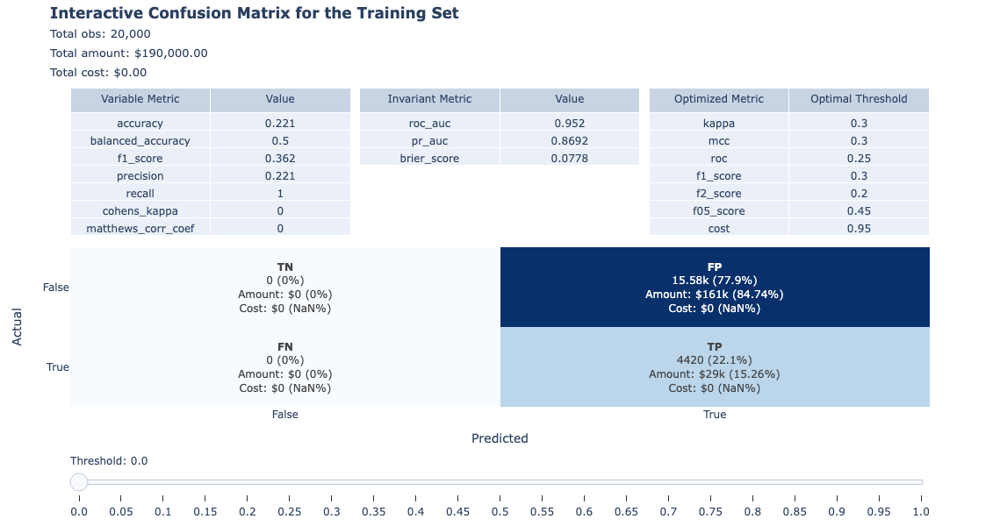

In [ ]:
#Training data
var_metrics_df, invar_metrics_df, opt_metrics_df = bc.confusion_matrix_plot(
    true_y = y,
    predicted_proba = y_pred_proba,
    threshold_step = threshold_step,
    amounts = amounts,
    cost_dict = train_cost_dict,
    optimize_threshold = optimize_threshold,
    #N_subsets = 70, subsets_size = 0.2, # default
    #with_replacement = False,           # default
    currency = currency,
    random_state = 123,
    title = 'Interactive Confusion Matrix for the Training Set')

In [ ]:
opt_metrics_df

,optimized_metric,optimal_threshold
0,kappa,0.30
1,mcc,0.30
2,roc,0.25
3,f1_score,0.30
4,f2_score,0.20
5,f05_score,0.45
6,cost,0.95


At 0.2 threshold, we have the max. profit of $11.259M

In [ ]:
#Load test set
test_data = pd.read_csv('test_data.csv')
test_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_JUNE,PAY_MAY,PAY_APRIL,PAY_MARCH,...,BILL_AMT_MARCH,BILL_AMT_FEBRUARY,BILL_AMT_JANUARY,PAY_AMT_JUNE,PAY_AMT_MAY,PAY_AMT_APRIL,PAY_AMT_MARCH,PAY_AMT_FEBRUARY,PAY_AMT_JANUARY,DEFAULT_JULY
0,11316,170000.0,1,2,2,36,-2,-2,-2,-2,...,1340.0,0.0,0.0,1598.0,0.0,1340.0,0.0,0.0,3200.0,0
1,26420,120000.0,1,2,2,25,0,0,2,0,...,3345.0,2929.0,2520.0,2446.0,438.0,1000.0,0.0,7.0,0.0,0
2,7847,250000.0,2,1,2,38,-1,-1,-1,-1,...,15410.0,1276.0,0.0,990.0,8150.0,15410.0,1276.0,0.0,0.0,0
3,8083,100000.0,1,1,1,55,0,0,0,0,...,17158.0,18758.0,17168.0,8000.0,2000.0,4000.0,2000.0,3000.0,0.0,0
4,7455,30000.0,1,1,2,56,2,0,0,0,...,29313.0,29019.0,28916.0,1480.0,1448.0,1021.0,1040.0,1216.0,1270.0,0


In [ ]:
#Drop ID
test_data.drop('ID', axis=1, inplace=True)

In [ ]:
#Split into X and y
X_test = test_data.drop('DEFAULT_JULY', axis=1)

#X_test = X_test[['LIMIT_BAL', 'MARRIAGE', 'BILL_AMT_APRIL', 'BILL_AMT_FEBRUARY', 'BILL_AMT_JUNE', 'BILL_AMT_MARCH', 'PAY_JUNE', 'PAY_MAY', 'PAY_AMT_JUNE', 'PAY_AMT_MARCH', 'PAY_AMT_MAY']]

y_test = test_data['DEFAULT_JULY']

In [ ]:
X_test = scaler.transform(X_test)

y_test_pred = predictor.predict(X_test)
y_test_pred_proba = predictor.predict_proba(X_test)[:, 1]

In [ ]:
threshold_step = 0.05
amounts = range(1000, X_test.shape[0], 1000)
currency = '$'

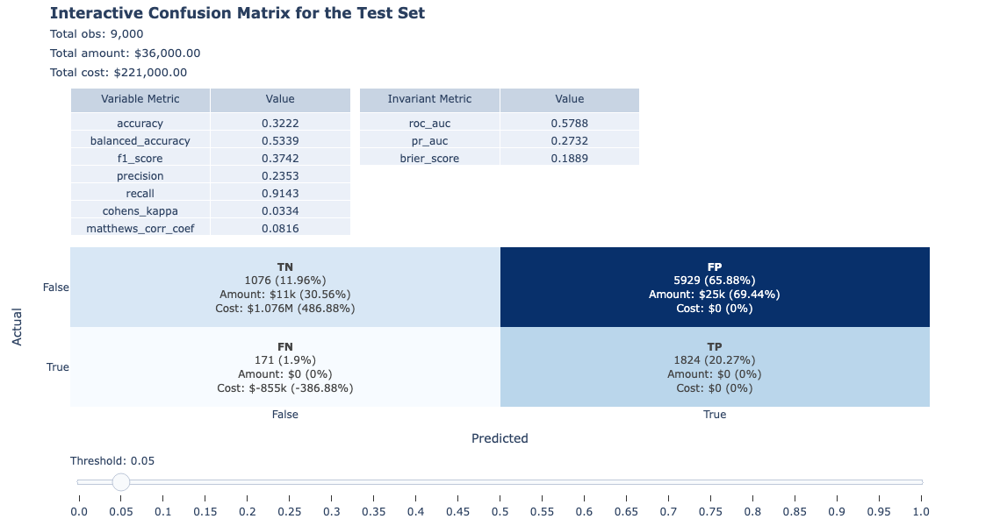

In [ ]:
var_metrics_df, invar_metrics_df, _= bc.confusion_matrix_plot(
    true_y = y_test,
    predicted_proba = y_test_pred_proba,
    threshold_step = threshold_step,
    amounts = amounts,
    cost_dict = train_cost_dict,
    #N_subsets = 70, subsets_size = 0.2, # default
    #with_replacement = False,           # default
    currency = currency,
    random_state = 123,
    title = 'Interactive Confusion Matrix for the Test Set')

The highest profit is at 0.05 threshold of $221k
